## Comparing ap_pipe results with different templates!

1. psfMatched
2. direct
3. compareWarp
4. dcr

In [1]:
import os
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [2]:
butlerPsf = dafPersist.Butler('/project/mrawls/hits2015/rerun/newtemplate1')
butlerDir = dafPersist.Butler('/project/mrawls/hits2015/rerun/direct3')
butlerCom = dafPersist.Butler('/project/mrawls/hits2015/rerun/comparewarp1')
butlerDcr = dafPersist.Butler('/project/mrawls/hits2015/rerun/dcr1')

butlerPsfTemplate = dafPersist.Butler('/project/mrawls/hits2014/coadds_good')
butlerDirTemplate = dafPersist.Butler('/project/mrawls/hits2014/coadds_direct')
butlerComTemplate = dafPersist.Butler('/project/mrawls/hits2014/coadds_comparewarp')
butlerDcrTemplate = dafPersist.Butler('/project/mrawls/hits2014/coadds_dcr2')

In [3]:
def load_database_old(repo):
    sqliteFile = 'association.db'
    connection = sqlite3.connect(os.path.join(repo, sqliteFile))

    tables = {'obj': 'dia_objects', 'src': 'dia_sources', 'ccd': 'CcdVisit'}

    objTable = pd.read_sql_query('select * from {0};'.format(tables['obj']), connection)
    srcTable = pd.read_sql_query('select * from {0};'.format(tables['src']), connection)
    ccdTable = pd.read_sql_query('select * from {0};'.format(tables['ccd']), connection)

    connection.close()
    
    return(objTable, srcTable, ccdTable)

def load_database_new(repo):
    sqliteFile = 'association.db'
    connection = sqlite3.connect(os.path.join(repo, sqliteFile))

    tables = {'obj': 'DiaObject', 'src': 'DiaSource', 'ccd': 'CcdVisit'}
    
    #queryObj = "select diaObjectId, ra, decl, nDiaSources, validityEnd from {0} where validityEnd is not NULL"
    #querySrc = "select diaSourceId, diaObjectId, ccdVisitId from {0}"

    objTable = pd.read_sql_query('select diaObjectId, ra, decl, nDiaSources, validityEnd from {0} where validityEnd is not NULL;'.format(tables['obj']), connection)
    srcTable = pd.read_sql_query('select diaSourceId, diaObjectId, ccdVisitId from {0};'.format(tables['src']), connection)
    #ccdTable = pd.read_sql_query('select * from {0};'.format(tables['ccd']), connection)

    connection.close()
    
    return(objTable, srcTable)#, ccdTable)

In [4]:
objTablePsf, srcTablePsf, ccdTablePsf = load_database_old('/project/mrawls/hits2015/rerun/newtemplate1')

In [5]:
objTableDir, srcTableDir = load_database_new('/project/mrawls/hits2015/rerun/direct3')

In [6]:
objTableCom, srcTableCom = load_database_new('/project/mrawls/hits2015/rerun/comparewarp1')

In [7]:
objTableDcr, srcTableDcr = load_database_new('/project/mrawls/hits2015/rerun/dcr1')

<IPython.core.display.Javascript object>


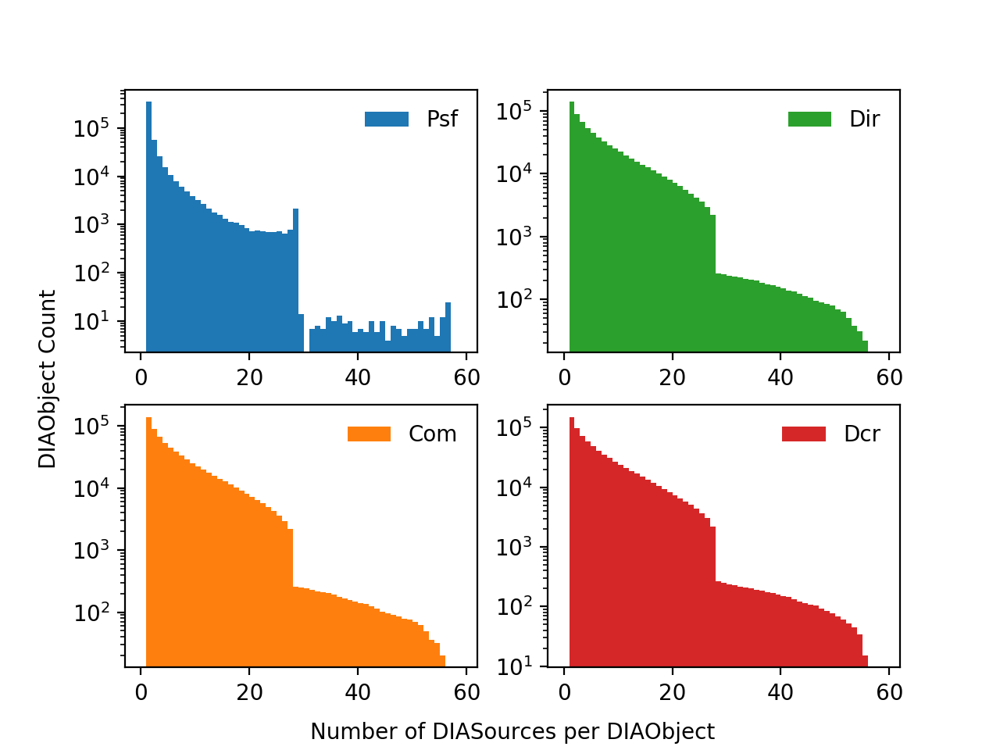

In [8]:
fig = plt.figure()

ax0 = fig.add_subplot(111, frameon=False)
ax0.tick_params(axis='both', which='both', 
                bottom=False, top=False, 
                labelbottom=False, right=False, 
                left=False, labelleft=False)
ax0.xaxis.labelpad = 25
ax0.yaxis.labelpad = 30
plt.xlabel('Number of DIASources per DIAObject')
plt.ylabel('DIAObject Count')

ax1 = fig.add_subplot(221)
plt.hist(objTablePsf['nDiaSources'].values, bins=np.arange(0, 60), label='Psf', color='C0')
plt.yscale('log')
plt.legend(frameon=False)

ax2 = fig.add_subplot(222)
plt.hist(objTableDir['nDiaSources'].values, bins=np.arange(0, 60), label='Dir', color='C2')
plt.yscale('log')
plt.legend(frameon=False)

ax3 = fig.add_subplot(223)
plt.hist(objTableCom['nDiaSources'].values, bins=np.arange(0, 60), label='Com', color='C1')
plt.yscale('log')
plt.legend(frameon=False)

ax4 = fig.add_subplot(224)
plt.hist(objTableDcr['nDiaSources'].values, bins=np.arange(0, 60), label='Dcr', color='C3')
plt.yscale('log')
plt.legend(frameon=False)

<IPython.core.display.Javascript object>


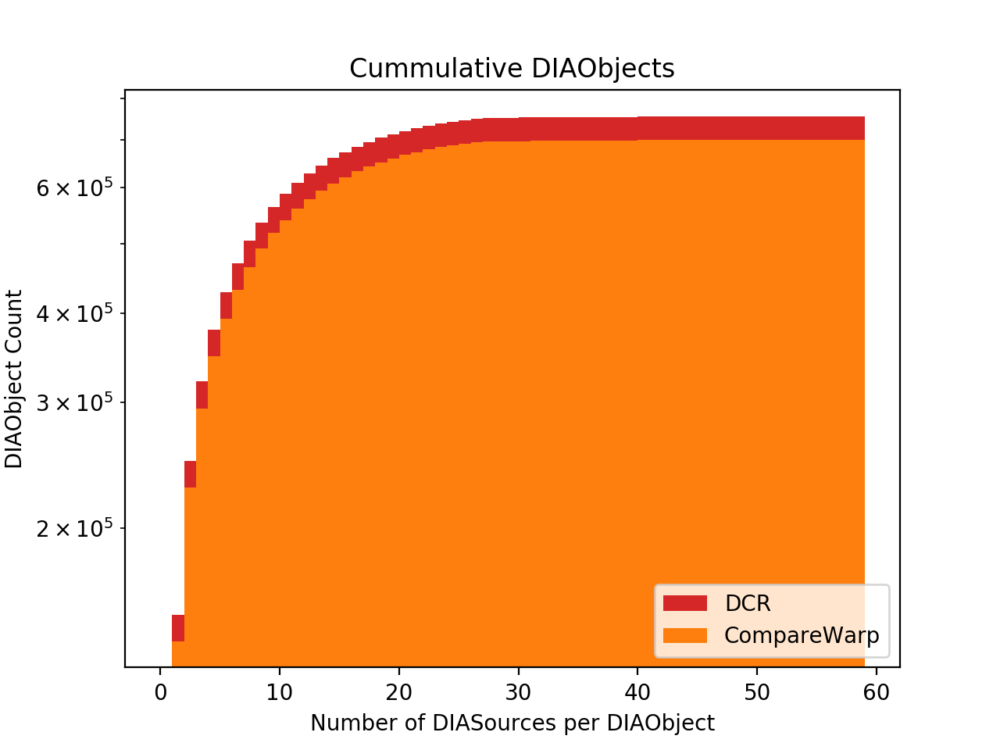

Text(0.5,1,'Cummulative DIAObjects')

In [9]:
plt.figure()
plt.hist(objTableDcr['nDiaSources'].values, bins=np.arange(0, 60), label='DCR', color='C3', cumulative=True)
plt.hist(objTableCom['nDiaSources'].values, bins=np.arange(0, 60), label='CompareWarp', color='C1', cumulative=True)
plt.yscale('log')
plt.xlabel('Number of DIASources per DIAObject')
plt.ylabel('DIAObject Count')
plt.legend(loc=4)
plt.title('Cummulative DIAObjects')

In [10]:
def plot_objects_old(objTable, srcTable, title=None):
    fig = plt.figure(facecolor='white', figsize=(10,8))
    
    dec_set1 = (objTable['coord_dec'] > -2)
    dec_set2 = ~dec_set1
    
    plt.subplots_adjust(wspace=0.1, hspace=0)

    # Panel 1: one HiTS field
    ax1 = plt.subplot2grid((4,4), (0,2), rowspan=4, colspan=2)
    ax1.set_facecolor('white')
    plot1 = ax1.scatter(objTable.loc[dec_set1, 'coord_ra'], objTable.loc[dec_set1, 'coord_dec'], marker='.',
                      lw=0, s=objTable.loc[dec_set1, 'nDiaSources'], c=objTable.loc[dec_set1, 'nDiaSources'],
                      alpha=0.4, cmap='inferno')
    plt.title(title, loc='left')
    plt.xlabel('RA')
    plt.ylabel('Dec')
    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')
    ax1.invert_xaxis()  # RA should increase to the left
    cb = fig.colorbar(plot1, orientation='horizontal', pad=0.3)
    cb.set_label('Number of Sources per Object')
    cb.set_clim(0, 60)

    # Panel 2: two (overlapping) HiTS fields
    ax2 = plt.subplot2grid((4,4), (0,0), rowspan=4, colspan=2)
    ax2.set_facecolor('white')
    plot2 = ax2.scatter(objTable.loc[dec_set2, 'coord_ra'], objTable.loc[dec_set2, 'coord_dec'], marker='.',
                      lw=0, s=objTable.loc[dec_set2, 'nDiaSources'], c=objTable.loc[dec_set2, 'nDiaSources'],
                      alpha=0.4, cmap='inferno')
    plt.xlabel('RA')
    plt.ylabel('Dec')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.invert_xaxis()
    cb2 = fig.colorbar(plot2, orientation='horizontal', pad=0.1)
    cb2.set_label('Number of Sources per Object')
    cb2.set_clim(0, 60)

def plot_objects_new(objTable, srcTable, title=None):
    fig = plt.figure(facecolor='white', figsize=(10,8))
    
    dec_set1 = (objTable['decl'] > -2)
    dec_set2 = ~dec_set1
    
    plt.subplots_adjust(wspace=0.1, hspace=0)

    # Panel 1: one HiTS field
    ax1 = plt.subplot2grid((4,4), (0,2), rowspan=4, colspan=2)
    ax1.set_facecolor('white')
    plot1 = ax1.scatter(objTable.loc[dec_set1, 'ra'], objTable.loc[dec_set1, 'decl'], marker='.',
                      lw=0, s=objTable.loc[dec_set1, 'nDiaSources'], c=objTable.loc[dec_set1, 'nDiaSources'],
                      alpha=0.4, cmap='inferno')
    plt.title(title, loc='left')
    plt.xlabel('RA')
    plt.ylabel('Dec')
    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')
    ax1.invert_xaxis()  # RA should increase to the left
    cb = fig.colorbar(plot1, orientation='horizontal', pad=0.3)
    cb.set_label('Number of Sources per Object')
    cb.set_clim(0, 60)

    # Panel 2: two (overlapping) HiTS fields
    ax2 = plt.subplot2grid((4,4), (0,0), rowspan=4, colspan=2)
    ax2.set_facecolor('white')
    plot2 = ax2.scatter(objTable.loc[dec_set2, 'ra'], objTable.loc[dec_set2, 'decl'], marker='.',
                      lw=0, s=objTable.loc[dec_set2, 'nDiaSources'], c=objTable.loc[dec_set2, 'nDiaSources'],
                      alpha=0.4, cmap='inferno')
    plt.xlabel('RA')
    plt.ylabel('Dec')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.invert_xaxis()
    cb2 = fig.colorbar(plot2, orientation='horizontal', pad=0.1)
    cb2.set_label('Number of Sources per Object')
    cb2.set_clim(0, 60)

<IPython.core.display.Javascript object>


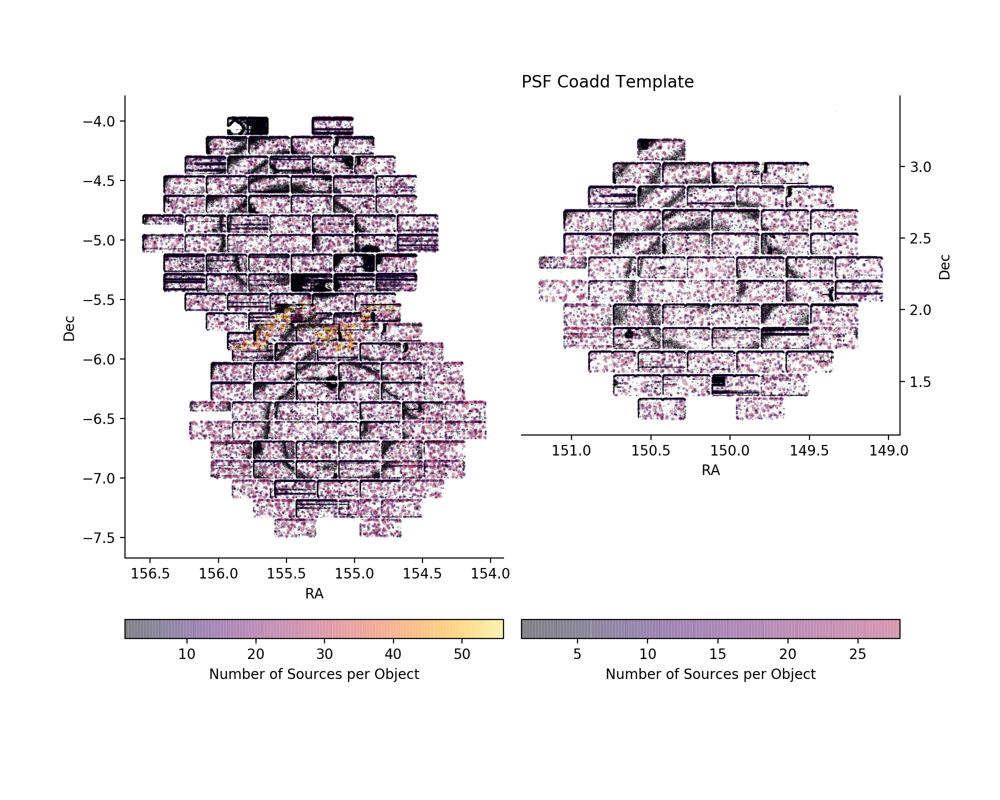

In [11]:
plot_objects_old(objTablePsf, srcTablePsf, 'PSF Coadd Template')

<IPython.core.display.Javascript object>


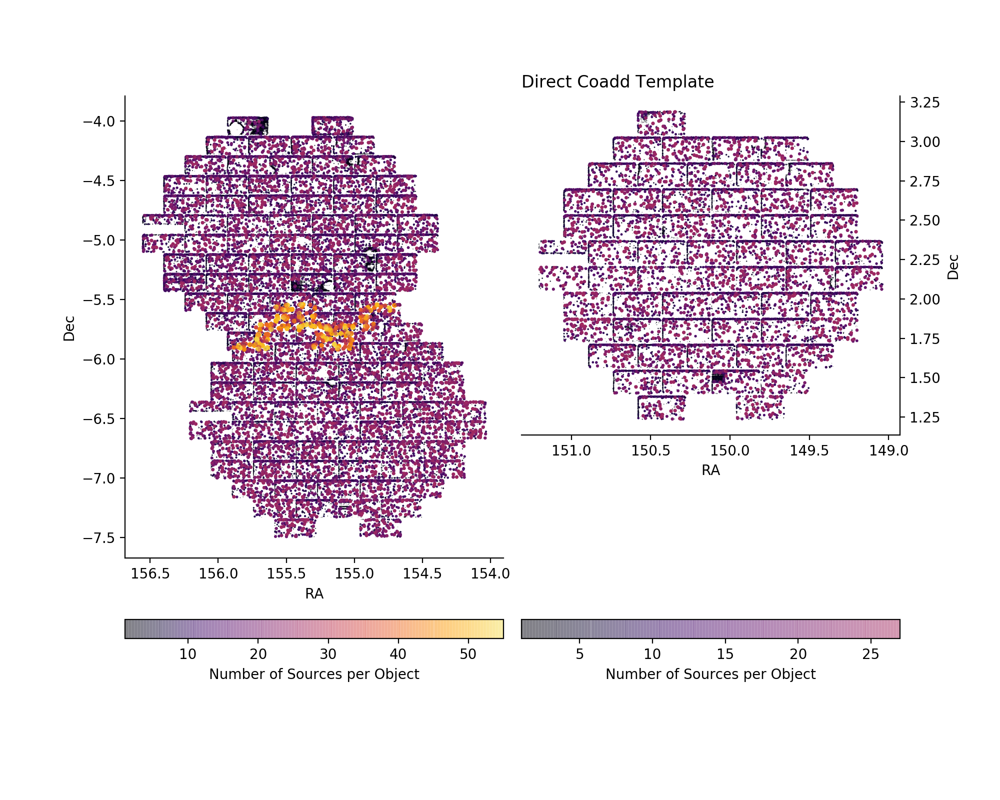

In [12]:
plot_objects_new(objTableDir, srcTableDir, title='Direct Coadd Template')

<IPython.core.display.Javascript object>


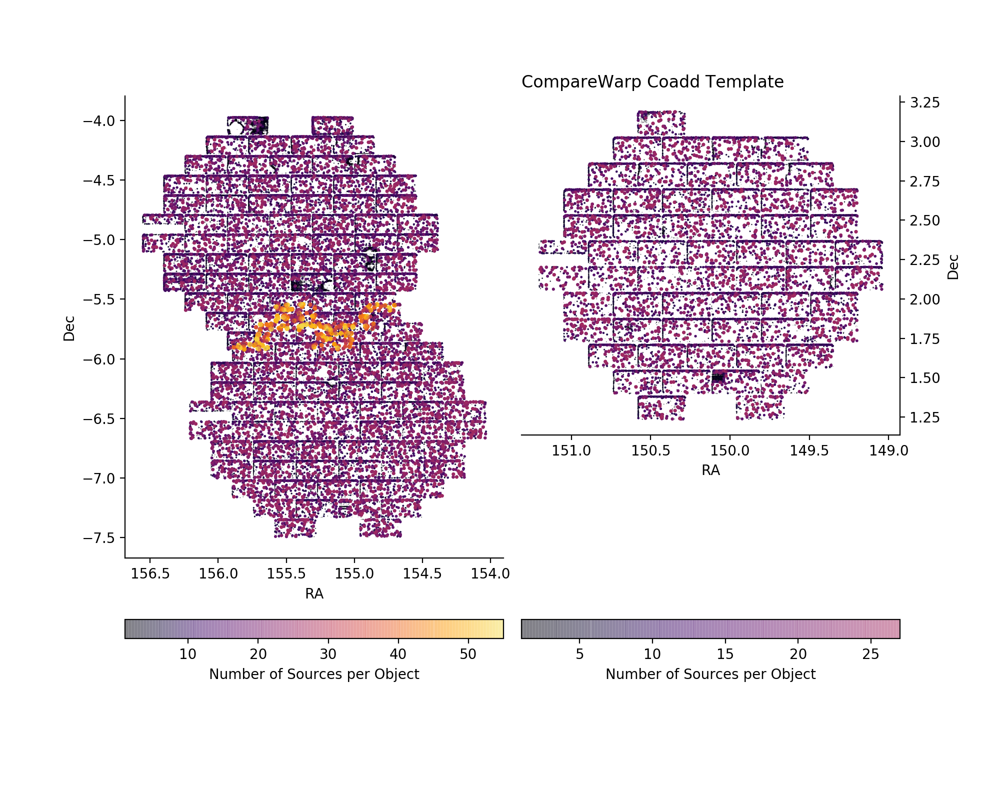

In [13]:
plot_objects_new(objTableCom, srcTableCom, title='CompareWarp Coadd Template')

<IPython.core.display.Javascript object>


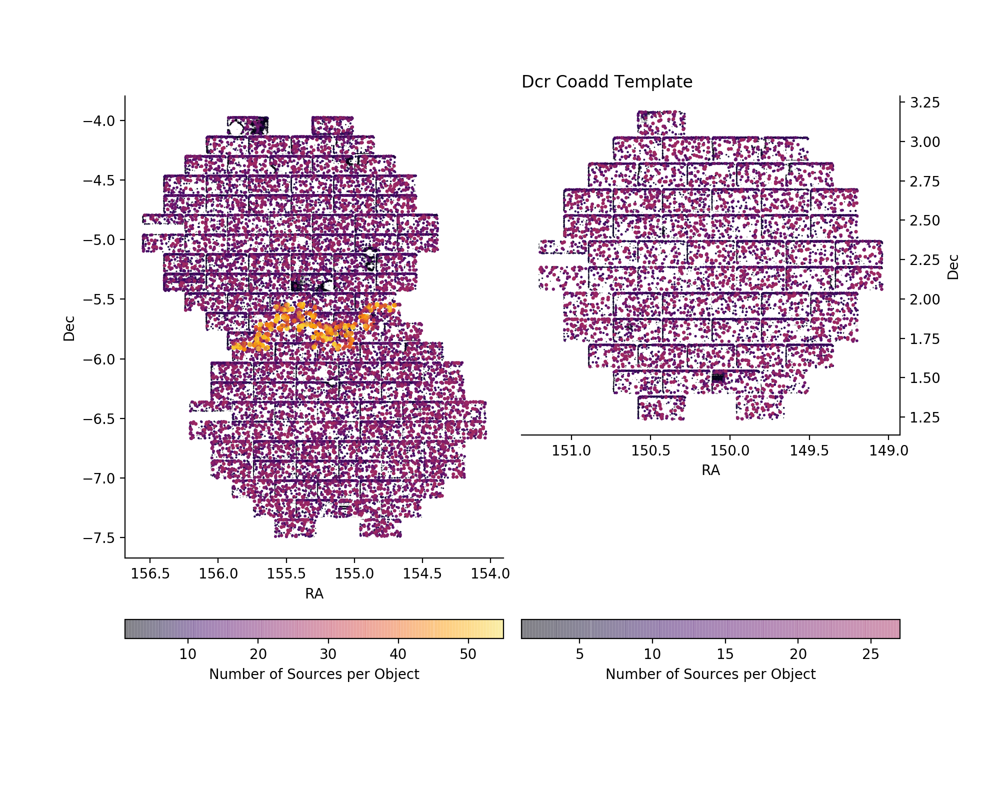

In [14]:
plot_objects_new(objTableDcr, srcTableDcr, title='Dcr Coadd Template')

In [15]:
def plot_mini_region_old(objTable, srcTable, title=None):
    mini_region = ((objTable['coord_dec'] < -5.3) & (objTable['coord_dec'] > -5.9) & 
                   (objTable['coord_ra'] > 155.0) & (objTable['coord_ra'] < 156.0) &
                   (objTable['nDiaSources'] > 1))

    fig = plt.figure(facecolor='white', figsize=(11,6))
    ax1 = fig.add_subplot(111)
    cb1 = ax1.scatter(objTable.loc[mini_region, 'coord_ra'], objTable.loc[mini_region, 'coord_dec'], marker='.',
                      lw=0, s=objTable.loc[mini_region, 'nDiaSources']*5, c=objTable.loc[mini_region, 'nDiaSources'],
                      alpha=0.5, cmap=plt.cm.get_cmap('inferno'))
    cbplot = plt.colorbar(cb1, ax=ax1)
    cbplot.set_label('Number of DIASources')
    cbplot.set_clim(0, 60)

    plt.xlabel('RA')
    plt.ylabel('Dec')
    plt.title(title)
    plt.xlim([156, 155.0])
    plt.ylim([-5.9, -5.3])

def plot_mini_region_new(objTable, srcTable, title=None):
    mini_region = ((objTable['decl'] < -5.3) & (objTable['decl'] > -5.9) & 
                   (objTable['ra'] > 155.0) & (objTable['ra'] < 156.0) &
                   (objTable['nDiaSources'] > 1))

    fig = plt.figure(facecolor='white', figsize=(11,6))
    ax1 = fig.add_subplot(111)
    cb1 = ax1.scatter(objTable.loc[mini_region, 'ra'], objTable.loc[mini_region, 'decl'], marker='.',
                      lw=0, s=objTable.loc[mini_region, 'nDiaSources']*5, c=objTable.loc[mini_region, 'nDiaSources'],
                      alpha=0.5, cmap=plt.cm.get_cmap('inferno'))
    cbplot = plt.colorbar(cb1, ax=ax1)
    cbplot.set_label('Number of DIASources')
    cbplot.set_clim(0, 60)

    plt.xlabel('RA')
    plt.ylabel('Dec')
    plt.title(title)
    plt.xlim([156, 155.0])
    plt.ylim([-5.9, -5.3])

<IPython.core.display.Javascript object>


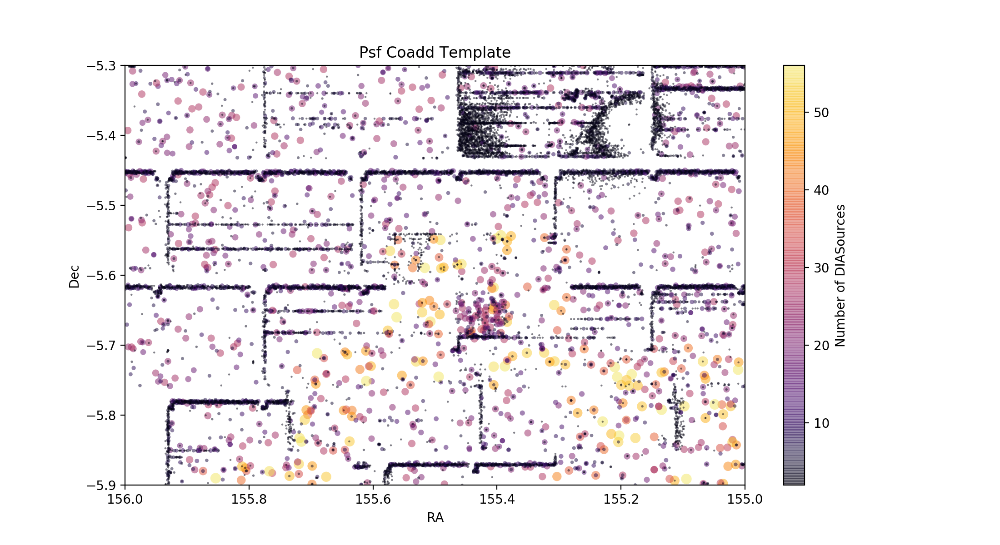

In [16]:
plot_mini_region_old(objTablePsf, srcTablePsf, 'Psf Coadd Template')

<IPython.core.display.Javascript object>


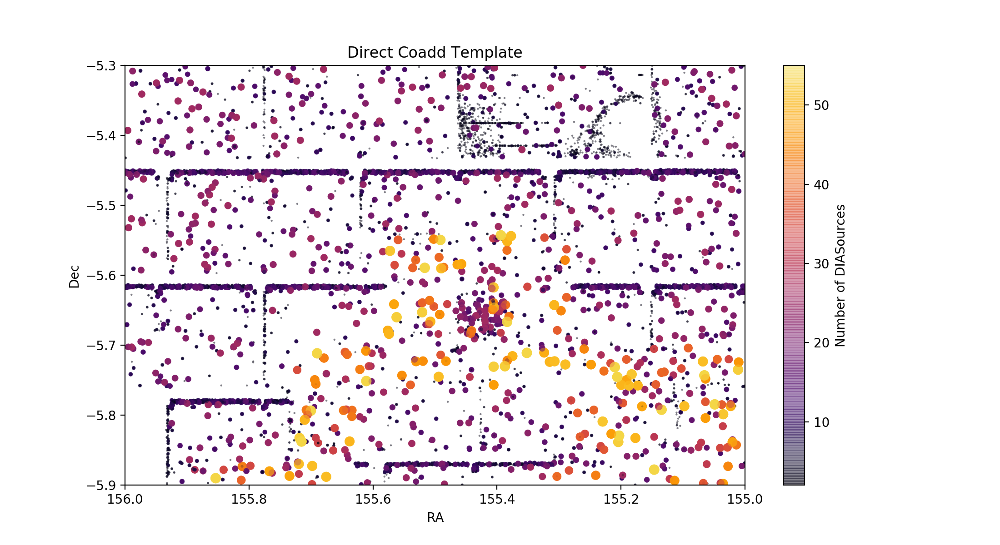

In [17]:
plot_mini_region_new(objTableDir, srcTableDir, 'Direct Coadd Template')

<IPython.core.display.Javascript object>


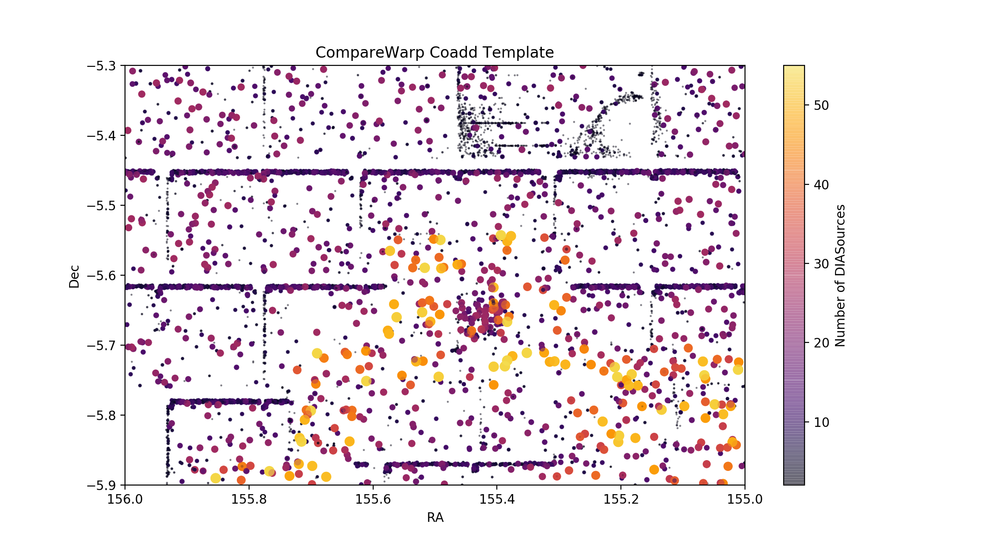

In [18]:
plot_mini_region_new(objTableCom, srcTableCom, 'CompareWarp Coadd Template')

<IPython.core.display.Javascript object>


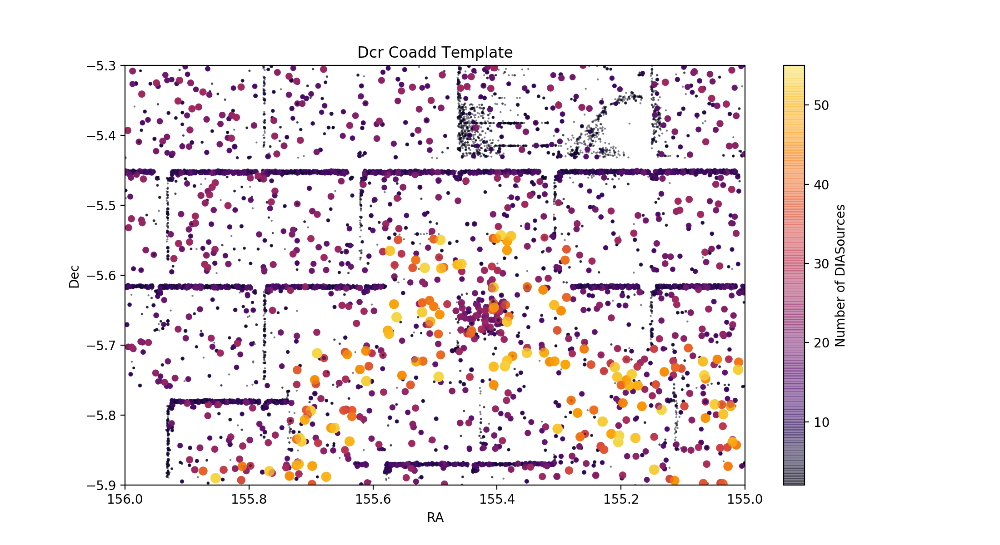

In [19]:
plot_mini_region_new(objTableDcr, srcTableDcr, 'Dcr Coadd Template')

In [20]:
objTablePsf.columns

Index(['id', 'coord_ra', 'coord_dec', 'parent', 'pixelId', 'nDiaSources',
       'psFluxMean_u', 'psFluxMeanErr_u', 'psFluxSigma_u', 'psFluxMean_g',
       'psFluxMeanErr_g', 'psFluxSigma_g', 'psFluxMean_r', 'psFluxMeanErr_r',
       'psFluxSigma_r', 'psFluxMean_i', 'psFluxMeanErr_i', 'psFluxSigma_i',
       'psFluxMean_z', 'psFluxMeanErr_z', 'psFluxSigma_z', 'psFluxMean_y',
       'psFluxMeanErr_y', 'psFluxSigma_y', 'psFluxMean_VR', 'psFluxMeanErr_VR',
       'psFluxSigma_VR'],
      dtype='object')

In [21]:
objTableDir.columns

Index(['diaObjectId', 'ra', 'decl', 'nDiaSources', 'validityEnd'], dtype='object')

In [22]:
from collections import Counter

dataId_compare = {'visit': 411758, 'ccdnum': 35, 'filter': 'g'}
compare_visits = [41175835, 41175828, 41175836, 41175829]

dcr_objects = []
for compare_visit in compare_visits:
    dcr_objects.extend(srcTableDcr.loc[srcTableDcr['ccdVisitId'] == compare_visit, 'diaObjectId'].values)
dcr_src_count = list(Counter(dcr_objects).values())

com_objects = []
for compare_visit in compare_visits:
    com_objects.extend(srcTableCom.loc[srcTableCom['ccdVisitId'] == compare_visit, 'diaObjectId'].values)
com_scr_count = list(Counter(com_objects).values())

objTableDcr.set_index('diaObjectId', inplace=True)  # ONLY DO THIS ONCE
srcTableDcr.set_index('diaSourceId', inplace=True)  # ONLY DO THIS ONCE
objTableCom.set_index('diaObjectId', inplace=True)  # ONLY DO THIS ONCE
srcTableCom.set_index('diaSourceId', inplace=True)  # ONLY DO THIS ONCE

<IPython.core.display.Javascript object>


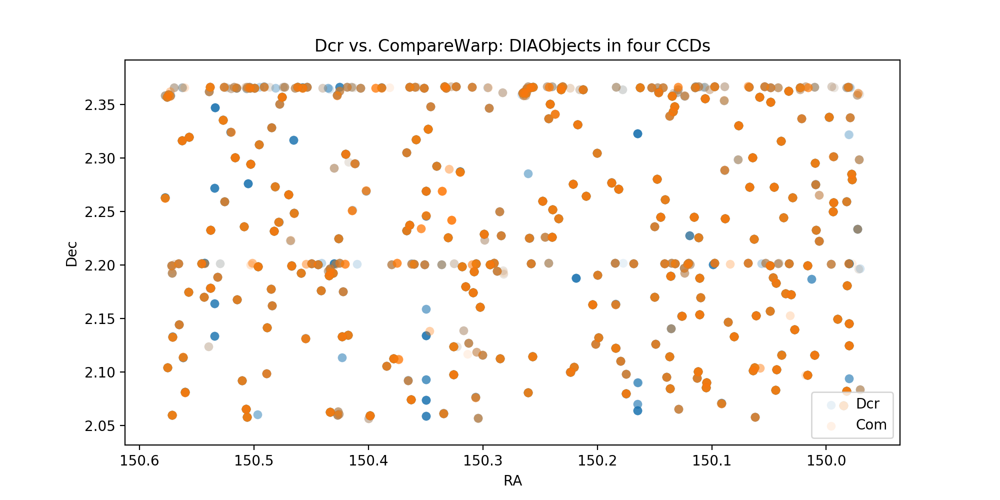

/software/lsstsw/stack_20181012/python/miniconda3-4.5.4/envs/lsst-scipipe/lib/python3.6/site-packages/pandas/core/indexing.py:1027: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [25]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)

dcr_visits = ax.scatter(objTableDcr.loc[dcr_objects, 'ra'], objTableDcr.loc[dcr_objects, 'decl'],
                         marker='o', lw=0, alpha=0.1, s=40, color='C0', label='Dcr')

com_visits = ax.scatter(objTableCom.loc[com_objects, 'ra'], objTableCom.loc[com_objects, 'decl'],
                         marker='o', lw=0, alpha=0.1, s=40, color='C1', label='Com')
plt.xlabel('RA')
plt.ylabel('Dec')
plt.title('Dcr vs. CompareWarp: DIAObjects in four CCDs')
plt.legend()
ax.invert_xaxis()